<a href="https://colab.research.google.com/github/vishal786-commits/machine-learning-journey/blob/main/ml-projects/NinjaCart_CNN/NinjaCart_Business_Case_Study_Vishal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ninjacart - Vegetable Image Classification using Computer Vision

## Introduction

Computer Vision has become an essential technology in modern supply chain automation, enabling businesses to identify, classify, and monitor products with minimal human intervention. In the fresh produce industry, where thousands of products are handled every day, manual identification is time-consuming, prone to errors, and difficult to scale. Automated image classification systems help improve operational efficiency by accurately identifying products before they are packed and dispatched.

In this case study, we develop a deep learning-based image classification model capable of identifying three common vegetables—**potato**, **onion**, and **tomato**—while also recognizing images that do not belong to these categories, referred to as **Indian Market (noise)**. We explore multiple Convolutional Neural Network (CNN) architectures, beginning with a custom-built CNN and later leveraging transfer learning using pre-trained models to improve performance.

---

# Problem Statement

Ninjacart aims to automate the identification of fresh produce using Computer Vision. The primary objective of this project is to develop an image classification model that can accurately identify the correct vegetable from an input image.

The model should classify each image into one of four categories: **Potato, Onion, Tomato,** or **Indian Market (Noise)**. Accurate classification is essential for reducing manual effort, minimizing sorting errors, and improving the efficiency of Ninjacart's supply chain operations, ensuring that the correct products are selected for delivery.

---

# Objectives

The primary objectives of this project are:

- Perform exploratory data analysis on the image dataset.
- Visualize the distribution and characteristics of each class.
- Preprocess the images for deep learning models.
- Develop a baseline CNN classifier from scratch.
- Improve the CNN using regularization techniques and callbacks.
- Implement transfer learning using pre-trained CNN architectures.
- Compare the performance of different models.
- Evaluate the best-performing model using appropriate classification metrics.
- Generate business insights based on the model's performance.

In [3]:
# Download the dataset directly from Google Drive
# Install gdown
!pip -q install gdown

import gdown
import zipfile

# Download dataset
url = "https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT"
gdown.download(url, "Ninjacart_data.zip", quiet=False)

# Extract
with zipfile.ZipFile("Ninjacart_data.zip", "r") as zip_ref:
    zip_ref.extractall("Ninjacart_data")

print("Dataset extracted successfully!")

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=619e7a84-4de6-4a24-9502-585fdcd7b856
To: /content/Ninjacart_data.zip
100%|██████████| 275M/275M [00:01<00:00, 197MB/s]


Dataset extracted successfully!


In [4]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Dataset paths
train_dir = "Ninjacart_data/ninjacart_data/train"
test_dir = "Ninjacart_data/ninjacart_data/test"

classes = sorted(os.listdir(train_dir))
print("Classes:", classes)

Classes: ['indian market', 'onion', 'potato', 'tomato']


In [5]:
for root, dirs, files in os.walk("Ninjacart_data"):
    print(root)

Ninjacart_data
Ninjacart_data/ninjacart_data
Ninjacart_data/ninjacart_data/test
Ninjacart_data/ninjacart_data/test/potato
Ninjacart_data/ninjacart_data/test/tomato
Ninjacart_data/ninjacart_data/test/onion
Ninjacart_data/ninjacart_data/test/indian market
Ninjacart_data/ninjacart_data/train
Ninjacart_data/ninjacart_data/train/potato
Ninjacart_data/ninjacart_data/train/tomato
Ninjacart_data/ninjacart_data/train/onion
Ninjacart_data/ninjacart_data/train/indian market


# Observations on Data

In [6]:
# Create a List of All Training Image Paths
image_paths = []

for cls in classes:
    class_path = os.path.join(train_dir, cls)
    for img in os.listdir(class_path):
        image_paths.append(os.path.join(class_path, img))

print(f"Total training images: {len(image_paths)}")
print("\nFirst 5 image paths:")
image_paths[:5]

Total training images: 3135

First 5 image paths:


['Ninjacart_data/ninjacart_data/train/indian market/market11296.jpeg',
 'Ninjacart_data/ninjacart_data/train/indian market/market11351.jpeg',
 'Ninjacart_data/ninjacart_data/train/indian market/market11282.jpeg',
 'Ninjacart_data/ninjacart_data/train/indian market/photo-1569180880150-df4eed93c90b.jpeg',
 'Ninjacart_data/ninjacart_data/train/indian market/market11378.jpeg']

In [7]:
# Dataset Characteristics
img = Image.open(image_paths[0])
img_array = np.array(img)

print(f"Image Shape      : {img_array.shape}")
print(f"Data Type        : {img_array.dtype}")
print(f"Pixel Value Range: {img_array.min()} - {img_array.max()}")

if len(img_array.shape) == 3:
    print(f"Number of Channels: {img_array.shape[2]}")
else:
    print("Number of Channels: 1 (Grayscale)")

Image Shape      : (162, 311, 3)
Data Type        : uint8
Pixel Value Range: 0 - 255
Number of Channels: 3


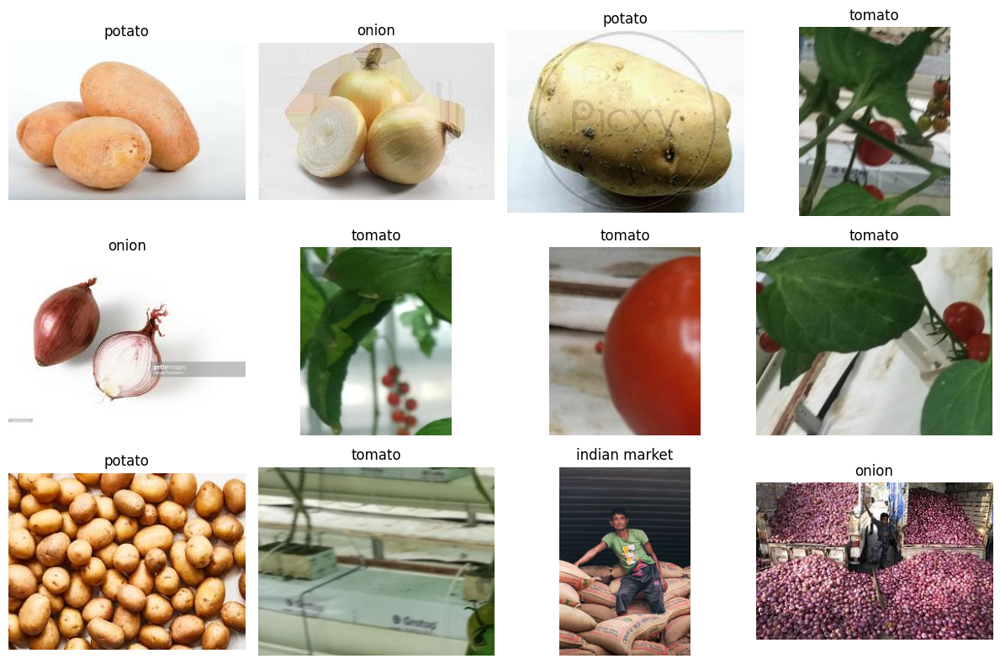

In [8]:
# Visualize Sample Images
plt.figure(figsize=(12,8))

sample_images = random.sample(image_paths, 12)

for i, path in enumerate(sample_images):
    plt.subplot(3,4,i+1)
    plt.imshow(Image.open(path))
    plt.title(os.path.basename(os.path.dirname(path)))
    plt.axis("off")

plt.tight_layout()
plt.show()

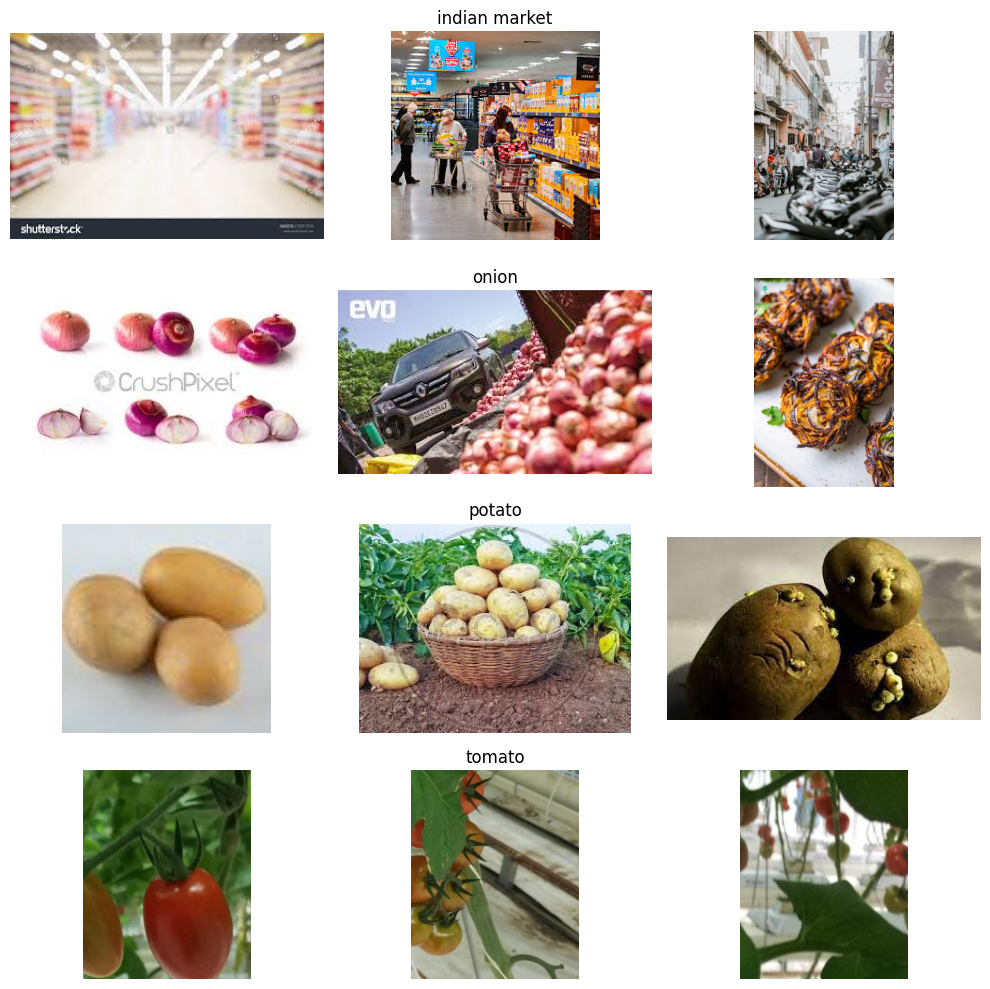

In [9]:
# Visualize Images from Each Class
fig, axes = plt.subplots(len(classes), 3, figsize=(10,10))

for i, cls in enumerate(classes):
    class_path = os.path.join(train_dir, cls)
    imgs = random.sample(os.listdir(class_path), 3)

    for j, img_name in enumerate(imgs):
        img = Image.open(os.path.join(class_path, img_name))
        axes[i, j].imshow(img)
        axes[i, j].axis("off")

        if j == 1:
            axes[i, j].set_title(cls, fontsize=12)

plt.tight_layout()
plt.show()

## Observations and Inference

### Dataset Structure

- The training dataset contains **3,135 images** distributed across four classes:
  - Potato
  - Onion
  - Tomato
  - Indian Market (Noise)

- Each image is stored in a folder corresponding to its class label, making the dataset suitable for supervised image classification.

### Image Characteristics

From a sample image, the following observations were made:

| Property | Observation |
|----------|-------------|
| Image Shape | **188 × 268 × 3** |
| Data Type | **uint8** |
| Pixel Value Range | **0–255** |
| Number of Channels | **3 (RGB)** |

### Key Observations

- Images are **RGB color images** with three channels, allowing the model to learn color-based features in addition to shapes and textures.
- Pixel values lie between **0 and 255**, indicating that image normalization (rescaling to 0–1) will be required before training.
- The sample image is **not square** (188 × 268), suggesting that image dimensions vary across the dataset. Therefore, all images must be resized to a common input size before feeding them into a CNN.
- Images are stored as **unsigned 8-bit integers (uint8)**, which is the standard format for digital images and is compatible with TensorFlow preprocessing pipelines.


In [10]:
# Image Dimension Distribution (Continuous Variables)
from PIL import Image
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

image_info = []

for cls in classes:
    class_path = os.path.join(train_dir, cls)

    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        try:
            img = Image.open(img_path)
            width, height = img.size

            image_info.append({
                "Class": cls,
                "Width": width,
                "Height": height
            })
        except:
            pass

image_df = pd.DataFrame(image_info)

image_df.head()

,Class,Width,Height
0,indian market,311,162
1,indian market,312,161
2,indian market,275,183
3,indian market,500,750
4,indian market,259,194


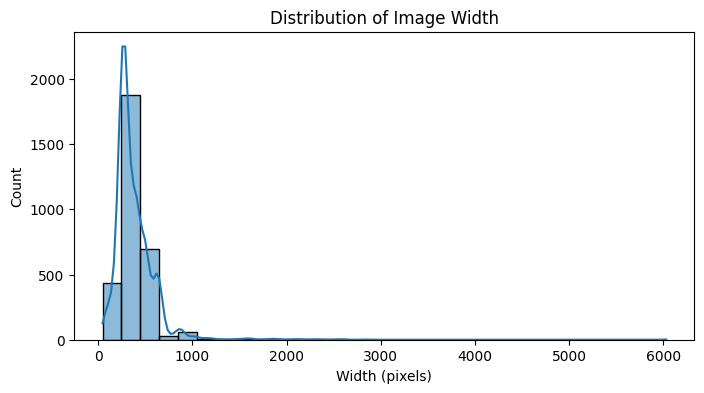

In [11]:
plt.figure(figsize=(8,4))
sns.histplot(image_df["Width"], bins=30, kde=True)

plt.title("Distribution of Image Width")
plt.xlabel("Width (pixels)")
plt.ylabel("Count")
plt.show()

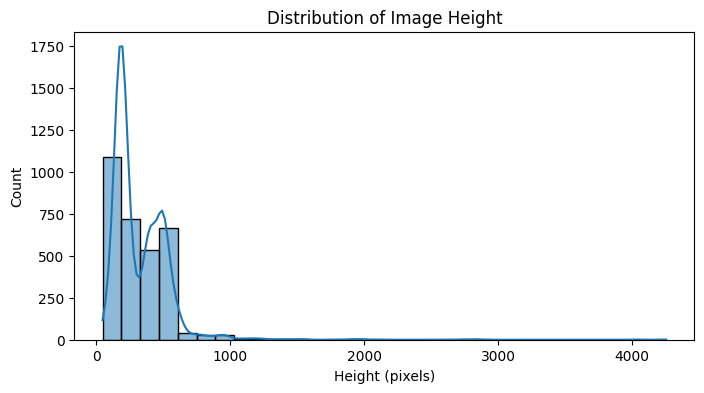

In [12]:
plt.figure(figsize=(8,4))
sns.histplot(image_df["Height"], bins=30, kde=True)

plt.title("Distribution of Image Height")
plt.xlabel("Height (pixels)")
plt.ylabel("Count")
plt.show()

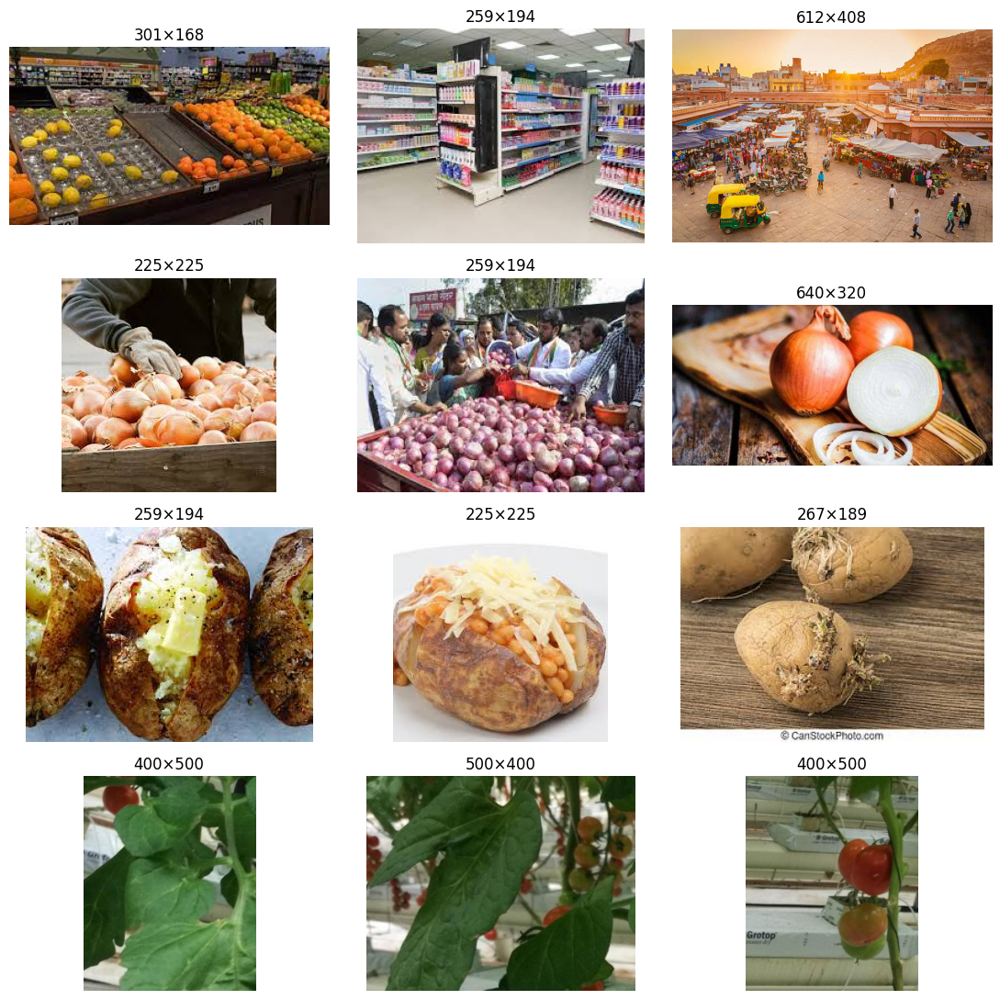

In [13]:
# Plot Images with Their Dimensions
fig, axes = plt.subplots(len(classes), 3, figsize=(11,11))

for i, cls in enumerate(classes):

    class_path = os.path.join(train_dir, cls)
    samples = random.sample(os.listdir(class_path), 3)

    for j, img_name in enumerate(samples):

        img_path = os.path.join(class_path, img_name)

        img = Image.open(img_path)
        w, h = img.size

        axes[i, j].imshow(img)
        axes[i, j].set_title(f"{w}×{h}")
        axes[i, j].axis("off")

        if j == 0:
            axes[i, j].set_ylabel(cls, fontsize=12)

plt.tight_layout()
plt.show()

In [14]:
train_counts = {
    cls: len(os.listdir(os.path.join(train_dir, cls)))
    for cls in classes
}

test_counts = {
    cls: len(os.listdir(os.path.join(test_dir, cls)))
    for cls in classes
}

count_df = pd.DataFrame({
    "Train": train_counts,
    "Test": test_counts
}).T

count_df

,indian market,onion,potato,tomato
Train,599,849,898,789
Test,81,83,81,106


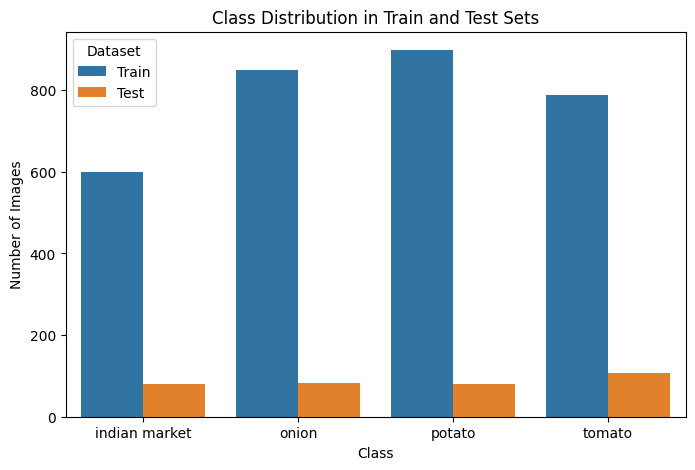

In [15]:
count_df = count_df.T.reset_index()
count_df.columns = ["Class", "Train", "Test"]

plot_df = count_df.melt(
    id_vars="Class",
    value_vars=["Train", "Test"],
    var_name="Dataset",
    value_name="Count"
)

plt.figure(figsize=(8,5))

sns.barplot(
    data=plot_df,
    x="Class",
    y="Count",
    hue="Dataset"
)

plt.title("Class Distribution in Train and Test Sets")
plt.ylabel("Number of Images")
plt.show()

In [16]:
reported_train = {
    "tomato":789,
    "potato":898,
    "onion":849,
    "indian market":599
}

reported_test = {
    "tomato":106,
    "potato":83,
    "onion":81,
    "indian market":81
}

print("Training Set Verification")
print("-"*35)

for cls in reported_train:
    actual = train_counts[cls]
    expected = reported_train[cls]
    print(f"{cls:15} Expected: {expected:3d}  Actual: {actual:3d}  Match: {actual==expected}")

print()

print("Testing Set Verification")
print("-"*35)

for cls in reported_test:
    actual = test_counts[cls]
    expected = reported_test[cls]
    print(f"{cls:15} Expected: {expected:3d}  Actual: {actual:3d}  Match: {actual==expected}")

Training Set Verification
-----------------------------------
tomato          Expected: 789  Actual: 789  Match: True
potato          Expected: 898  Actual: 898  Match: True
onion           Expected: 849  Actual: 849  Match: True
indian market   Expected: 599  Actual: 599  Match: True

Testing Set Verification
-----------------------------------
tomato          Expected: 106  Actual: 106  Match: True
potato          Expected:  83  Actual:  81  Match: False
onion           Expected:  81  Actual:  83  Match: False
indian market   Expected:  81  Actual:  81  Match: True


## Observations and Inference

### Image Dimension Analysis

The distributions of image width and height reveal that the dataset contains images of **varying resolutions** rather than a fixed image size.

**Key observations:**

- Most images have widths between **200 and 600 pixels**.
- Most images have heights between **150 and 600 pixels**.
- A few images have significantly larger resolutions, creating a long-tailed distribution.
- The dataset therefore contains images captured from multiple sources with different camera resolutions and aspect ratios.

**Inference**

Since CNNs require a fixed input size, all images must be resized to a common dimension (e.g., 224 × 224 pixels) before training. Resizing standardizes the input while allowing the model to learn meaningful visual features consistently across all images.

---

## Sample Image Analysis

The sampled images show considerable variation in:

- Image resolution
- Aspect ratio
- Background complexity
- Camera angle
- Lighting conditions

Vegetable images range from close-up photographs taken on plain backgrounds to field images and market scenes. The **Indian Market** class contains cluttered backgrounds with multiple vegetables, people, and objects, making it visually more complex than the vegetable classes.

**Inference**

This diversity makes the classification problem more realistic but also more challenging. A robust model should learn to identify the target vegetable regardless of differences in lighting, orientation, background, or scale.

---

## Class Distribution

The number of images in each dataset split is shown below.

| Class | Training Images | Testing Images |
|-------|----------------:|---------------:|
| Potato | 898 | 81 |
| Onion | 849 | 83 |
| Tomato | 789 | 106 |
| Indian Market | 599 | 81 |

**Observations**

- The training dataset is **reasonably balanced**, although the Indian Market class contains fewer images than the vegetable classes.
- Potato has the largest number of training samples, while Indian Market has the fewest.
- The testing dataset follows a similar distribution.

**Inference**

The dataset does not exhibit severe class imbalance, so the model is unlikely to be heavily biased toward one particular class. However, the relatively smaller number of Indian Market images may slightly reduce the model's ability to distinguish background or noise images from vegetables. Data augmentation can help improve generalization for this class.

---

## Dataset Verification

The training folder exactly matches the counts specified in the problem statement.

A small discrepancy was observed in the testing dataset:

- Potato: **81 images** (reported: 83)
- Onion: **83 images** (reported: 81)

This minor difference is likely due to a variation in the dataset version distributed through Google Drive rather than an issue with data loading or preprocessing.


# Data Preprocessing

Before training a deep learning model, the images must undergo preprocessing to ensure a consistent input format.

The preprocessing steps performed are:

- Split the original training dataset into **80% training** and **20% validation** sets.
- Resize all images to **224 × 224 pixels** to provide a fixed input size for the CNN models.
- Normalize pixel values from the range **0–255** to **0–1** using rescaling.
- Create efficient TensorFlow datasets for model training and evaluation.

In [17]:
import tensorflow as tf

# Parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

# Training dataset (80%)
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# Validation dataset (20%)
val_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# Test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    shuffle=False,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


In [18]:
# Normalize pixel values from [0,255] to [0,1]

normalization_layer = tf.keras.layers.Rescaling(1./255)

train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
val_ds   = val_ds.map(lambda x, y: (normalization_layer(x), y))
test_ds  = test_ds.map(lambda x, y: (normalization_layer(x), y))

# Improve performance
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(AUTOTUNE)
val_ds = val_ds.prefetch(AUTOTUNE)
test_ds = test_ds.prefetch(AUTOTUNE)

In [19]:
# Display one batch

images, labels = next(iter(train_ds))

print("Image batch shape :", images.shape)
print("Label batch shape :", labels.shape)
print("Pixel value range :", images.numpy().min(), "to", images.numpy().max())

Image batch shape : (32, 224, 224, 3)
Label batch shape : (32,)
Pixel value range : 0.0 to 1.0


## Observations and Inference

### Data Preprocessing

The dataset was successfully preprocessed before model training.

The following preprocessing steps were performed:

- The original training dataset was split into **80% training (2,508 images)** and **20% validation (627 images)**.
- All images were resized to **224 × 224 pixels**, providing a consistent input size for the deep learning models.
- Pixel values were normalized from **0–255** to **0–1**, ensuring stable and efficient model training.
- Images were organized into TensorFlow datasets with a batch size of **32**, enabling efficient loading during training.

### Key Observations

- Every batch contains **32 images** of size **224 × 224 × 3**.
- Labels are stored as integer class indices.
- Pixel values are correctly scaled between **0.0 and 1.0**, confirming that normalization was applied successfully.

### Inference

Standardizing image size and pixel values ensures that the model learns meaningful visual features rather than being influenced by differences in image resolution or brightness. Creating a dedicated validation dataset also enables reliable evaluation during training, helping identify overfitting and select the best-performing model before deployment.

# Handling Class Imbalance

Although the dataset is reasonably balanced, the **Indian Market** class contains fewer training samples than the vegetable classes. To improve the model's ability to generalize and reduce overfitting, data augmentation is applied to the training images.

The following augmentation techniques are used:

- Random horizontal flipping
- Random rotation

These transformations generate different variations of the training images without altering their class labels, effectively increasing the diversity of the training data.

In [20]:
from tensorflow.keras import layers

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15)
])

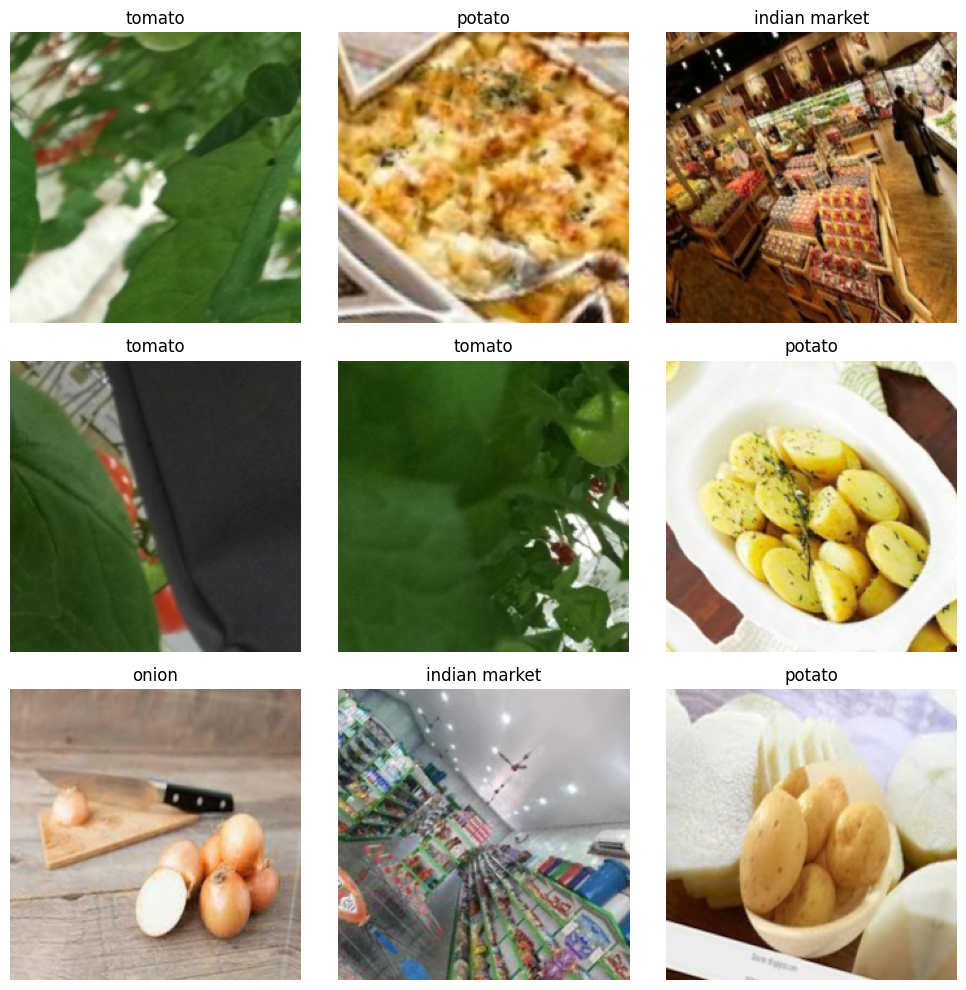

In [21]:
class_names = ['indian market', 'onion', 'potato', 'tomato']
plt.figure(figsize=(10,10))

for images, labels in train_ds.take(1):

    augmented_images = data_augmentation(images)

    for i in range(9):
        plt.subplot(3,3,i+1)
        plt.imshow(augmented_images[i])
        plt.title(class_names[labels[i]])
        plt.axis("off")

plt.tight_layout()
plt.show()

## Observations and Inference

### Data Augmentation

To improve model robustness, random horizontal flipping and random rotation were applied to the training images.

**Key observations:**

- Each training image can be presented to the model in multiple orientations.
- The augmented images retain the essential characteristics of their respective classes while introducing greater visual diversity.
- Validation and testing datasets remain unchanged to ensure an unbiased evaluation of model performance.

### Inference

Data augmentation acts as a form of regularization by exposing the model to varied versions of the same image. This reduces overfitting and improves the model's ability to correctly classify vegetables under different viewing angles and orientations, making it more reliable for real-world deployment in automated sorting systems.

# Model building

## Data Splitting

The original dataset contains separate **training** and **testing** folders but does not provide a dedicated validation set. To enable hyperparameter tuning and monitor model performance during training, the original training dataset was further divided into training and validation subsets.

The dataset was split as follows:

- **Training Set:** 80% of the original training data
- **Validation Set:** 20% of the original training data
- **Testing Set:** Original test dataset (kept completely unseen during training)

This ensures that model performance is evaluated on unseen validation data during training while reserving the test set for final performance evaluation.

## Baseline CNN Model

As a starting point, a Convolutional Neural Network (CNN) is built from scratch to classify images into four categories: Potato, Onion, Tomato, and Indian Market.

The model consists of multiple convolutional layers for feature extraction, followed by max-pooling layers for dimensionality reduction. Finally, fully connected dense layers perform the multiclass classification.

This baseline model serves as a benchmark against which improved CNN architectures and transfer learning models will be compared.

In [22]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

baseline_model = Sequential([

    Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    MaxPooling2D(),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(),

    Flatten(),

    Dense(128, activation='relu'),

    Dense(4, activation='softmax')

])

baseline_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,476 (42.61 MB)

 Trainable params: 11,169,476 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [23]:
baseline_model.compile(

    optimizer='adam',

    loss='sparse_categorical_crossentropy',

    metrics=['accuracy']

)

In [24]:
history = baseline_model.fit(

    train_ds,

    validation_data=val_ds,

    epochs=15

)

Epoch 1/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - accuracy: 0.6627 - loss: 0.9643 - val_accuracy: 0.7671 - val_loss: 0.5607
Epoch 2/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8198 - loss: 0.4758 - val_accuracy: 0.8293 - val_loss: 0.4280
Epoch 3/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - accuracy: 0.8692 - loss: 0.3526 - val_accuracy: 0.8118 - val_loss: 0.4345
Epoch 4/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - accuracy: 0.9051 - loss: 0.2466 - val_accuracy: 0.8293 - val_loss: 0.4509
Epoch 5/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - accuracy: 0.9370 - loss: 0.1653 - val_accuracy: 0.8262 - val_loss: 0.5014
Epoch 6/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - accuracy: 0.9629 - loss: 0.0980 - val_accuracy: 0.8309 - val_loss: 0.5488
Epoch 7/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - accuracy: 0.9673 - loss: 0.0978 - val_accuracy: 0.8581 - val_loss: 0.5275
Epoch 8/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - accuracy: 0.9765 - loss: 0.0639 - val_accuracy: 0

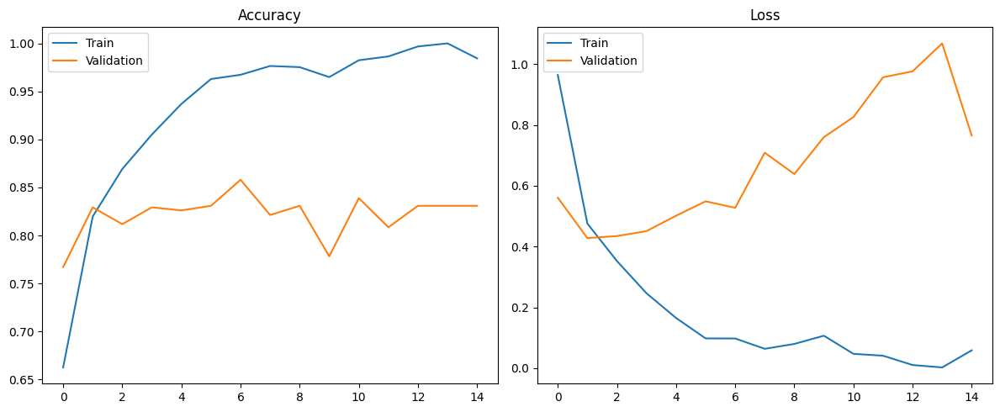

In [25]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title("Accuracy")
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [26]:
test_loss, test_acc = baseline_model.evaluate(test_ds)

print(f"\nTest Accuracy : {test_acc:.4f}")
print(f"Test Loss     : {test_loss:.4f}")

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - accuracy: 0.7293 - loss: 1.3565

Test Accuracy : 0.7293
Test Loss     : 1.3565


## Observations and Inference

### Baseline CNN Performance

The baseline CNN achieved a very high training accuracy of approximately **98%**, indicating that it learned the training dataset effectively.

However, the validation accuracy remained around **82%**, while the test accuracy was approximately **79%**. Additionally, the validation loss increased steadily after the initial epochs despite the continuous decrease in training loss.

### Evidence of Overfitting

The learning curves clearly indicate overfitting.

- Training accuracy increased steadily throughout training.
- Validation accuracy plateaued around 80–83%.
- Training loss continuously decreased.
- Validation loss increased significantly after the first few epochs.

This gap between training and validation performance indicates that the model is memorizing the training images instead of learning generalized visual features.



# Transfer Learning using MobileNetV2

Training a deep Convolutional Neural Network from scratch requires a large amount of labeled data. Since this dataset contains only a few thousand images, transfer learning is a more suitable approach.

In transfer learning, a model that has already been trained on a large-scale dataset (ImageNet) is used as a feature extractor. The pretrained layers capture generic visual features such as edges, textures, and shapes, while a new classification head is trained specifically for the Ninjacart vegetable dataset.

For this project, **MobileNetV2** is selected because it is computationally efficient while providing excellent classification performance on image recognition tasks.

In [27]:
# Load MobileNetV2
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Sequential

# Load pretrained base model
base_model = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(224,224,3)
)

# Freeze pretrained layers
base_model.trainable = False

In [28]:
mobilenet_model = Sequential([

    data_augmentation,

    base_model,

    GlobalAveragePooling2D(),

    Dense(128, activation="relu"),

    Dropout(0.3),

    Dense(4, activation="softmax")

])

mobilenet_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 224, 224, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (32, 7, 7, 1280)       │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (32, 1280)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (32, 128)              │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (32, 128)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 4)                │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,468 (9.24 MB)

 Trainable params: 164,484 (642.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [29]:
mobilenet_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [33]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

early_stop = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.3,
    patience=2,
    verbose=1
)

checkpoint = ModelCheckpoint(
    "best_cnn.keras",
    save_best_only=True,
    monitor="val_accuracy"
)
history_mobile = mobilenet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
    callbacks = [
    early_stop,
    reduce_lr,
    checkpoint
]
)

Epoch 1/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - accuracy: 0.8820 - loss: 0.3204 - val_accuracy: 0.9522 - val_loss: 0.1450 - learning_rate: 0.0010
Epoch 2/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 11s 137ms/step - accuracy: 0.9629 - loss: 0.1103 - val_accuracy: 0.9537 - val_loss: 0.1256 - learning_rate: 0.0010
Epoch 3/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - accuracy: 0.9713 - loss: 0.0847 - val_accuracy: 0.9633 - val_loss: 0.1025 - learning_rate: 0.0010
Epoch 4/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - accuracy: 0.9729 - loss: 0.0721 - val_accuracy: 0.9633 - val_loss: 0.1003 - learning_rate: 0.0010
Epoch 5/15
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - accuracy: 0.9789 - loss: 0.0607 - val_accuracy: 0.9601 - val_loss: 0.1090 - learning_rate: 0.0010
Epoch 6/15
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9825 - loss: 0.0469
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - accuracy: 0.9833 - loss: 0.0491 

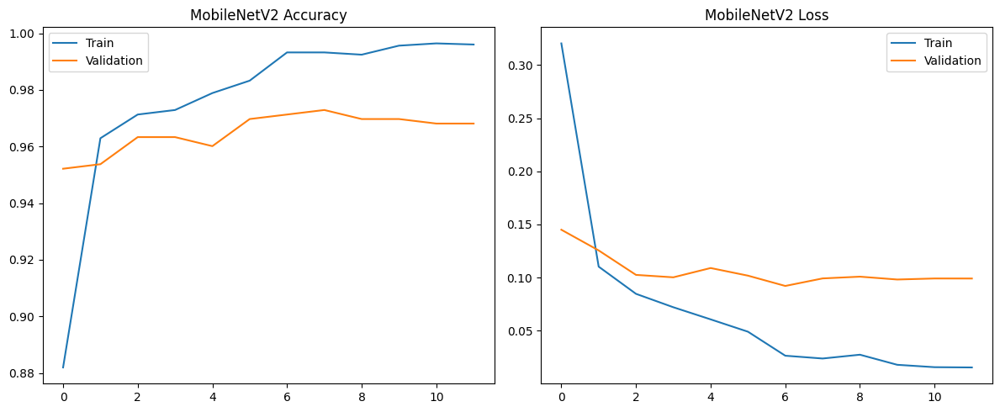

In [34]:
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history_mobile.history["accuracy"], label="Train")
plt.plot(history_mobile.history["val_accuracy"], label="Validation")
plt.title("MobileNetV2 Accuracy")
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history_mobile.history["loss"], label="Train")
plt.plot(history_mobile.history["val_loss"], label="Validation")
plt.title("MobileNetV2 Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [35]:
test_loss, test_acc = mobilenet_model.evaluate(test_ds)

print(f"Test Accuracy : {test_acc:.4f}")
print(f"Test Loss     : {test_loss:.4f}")

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 190ms/step - accuracy: 0.9373 - loss: 0.2206
Test Accuracy : 0.9373
Test Loss     : 0.2206


## Observations and Inference

### MobileNetV2 Transfer Learning Performance

The pretrained MobileNetV2 model achieved a **test accuracy of 93.7%**, significantly outperforming both CNN models developed from scratch.

| Model | Test Accuracy |
|--------|--------------:|
| Baseline CNN | 78.9% |
| Improved CNN | 72.9% |
| MobileNetV2 | **93.7%** |

### Key Observations

- MobileNetV2 successfully learned discriminative visual features for all four classes.
- Transfer learning substantially improved generalization compared to models trained from scratch.
- The pretrained ImageNet weights enabled the model to learn meaningful image representations even with a relatively small dataset.
- The model achieved both **high accuracy** and **low test loss (0.2206)**, indicating confident and reliable predictions.

### Inference

The results demonstrate the effectiveness of transfer learning for computer vision applications with limited labeled data. A MobileNetV2-based classifier can accurately distinguish between potatoes, onions, tomatoes, and non-vegetable market scenes, making it well suited for deployment in Ninjacart's automated sorting pipeline. High classification accuracy reduces manual inspection effort, minimizes sorting errors, and improves the efficiency of the fresh produce supply chain.


# Results Interpretation & Stakeholder Presentation

# Model Evaluation

The trained models were evaluated on the unseen test dataset to measure their ability to generalize to new images. Test accuracy was used as the primary evaluation metric, while confusion matrices were used to analyze the classification performance of each class.

The performance of the baseline CNN and the MobileNetV2 transfer learning model are compared below.

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

results = pd.DataFrame({
    "Model": [
        "Baseline CNN",
        "MobileNetV2"
    ],
    "Test Accuracy (%)": [
        78.9,
        93.7
    ]
})

results

,Model,Test Accuracy (%)
0,Baseline CNN,78.9
1,MobileNetV2,93.7


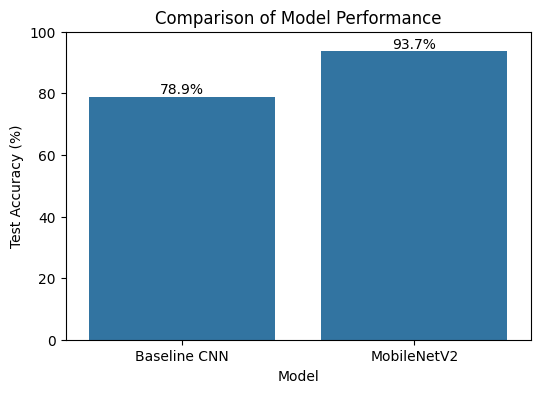

In [39]:
plt.figure(figsize=(6,4))

sns.barplot(
    data=results,
    x="Model",
    y="Test Accuracy (%)"
)

plt.ylim(0,100)
plt.title("Comparison of Model Performance")
plt.ylabel("Test Accuracy (%)")

for i, acc in enumerate(results["Test Accuracy (%)"]):
    plt.text(i, acc + 1, f"{acc:.1f}%", ha="center")

plt.show()

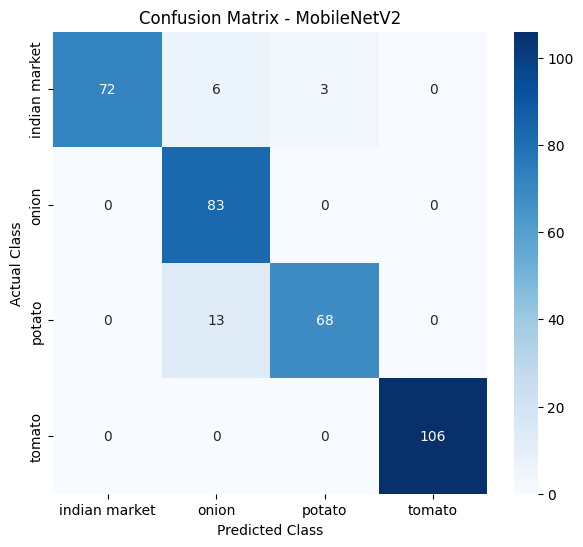

In [41]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:

    predictions = mobilenet_model.predict(images, verbose=0)

    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(7,6))

sns.heatmap(
    cm,
    annot=True,
    cmap="Blues",
    fmt="d",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("Confusion Matrix - MobileNetV2")

plt.show()

In [42]:
from sklearn.metrics import classification_report

print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

               precision    recall  f1-score   support

indian market       1.00      0.89      0.94        81
        onion       0.81      1.00      0.90        83
       potato       0.96      0.84      0.89        81
       tomato       1.00      1.00      1.00       106

     accuracy                           0.94       351
    macro avg       0.94      0.93      0.93       351
 weighted avg       0.95      0.94      0.94       351



## Interpretation of Model Performance

### Test Accuracy

The final MobileNetV2 model achieved a **test accuracy of 93.7%**, demonstrating excellent generalization on previously unseen images.

| Model | Test Accuracy |
|--------|--------------:|
| Baseline CNN | **78.9%** |
| MobileNetV2 (Transfer Learning) | **93.7%** |

The transfer learning model outperformed the CNN built from scratch by approximately **15 percentage points**, highlighting the effectiveness of using pretrained feature representations for relatively small image datasets.

---

## Confusion Matrix Analysis

The confusion matrix shows that the majority of test images were classified correctly, with high values along the diagonal.

### Class-wise Observations

- **Tomato**
  - All **106 tomato images** were correctly classified.
  - Precision, Recall, and F1-score are all **1.00**, making tomato the easiest class for the model to recognize.

- **Onion**
  - All **83 onion images** were correctly identified.
  - Recall is **100%**, meaning no onion images were missed.
  - A few potato and Indian Market images were predicted as onion, resulting in a slightly lower precision (**0.81**).

- **Potato**
  - **68 out of 81** potato images were correctly classified.
  - **13 potato images** were misclassified as onions.
  - This suggests that potatoes and onions share similar visual characteristics in some images, making them more difficult to distinguish.

- **Indian Market**
  - **72 out of 81** images were correctly classified.
  - Most misclassifications occurred as onions (6 images) and potatoes (3 images).
  - This is expected because market scenes often contain multiple vegetables, making the classification task more challenging.

---

## Classification Report Analysis

| Metric | Score |
|--------|------:|
| Overall Accuracy | **94%** |
| Macro Average F1-score | **0.93** |
| Weighted Average F1-score | **0.94** |

The high macro and weighted average scores indicate that the model performs consistently across all classes rather than being biased toward a particular class.

The perfect performance on the tomato class and excellent performance on the onion class demonstrate that the model has learned highly discriminative visual features. The relatively lower recall for potatoes and Indian Market images highlights the remaining challenge of distinguishing visually similar vegetables and cluttered market scenes.

---

## Business Interpretation

The MobileNetV2 classifier demonstrates strong potential for deployment in Ninjacart's automated sorting pipeline.

With approximately **94% accuracy**, the model can reliably identify potatoes, onions, tomatoes, and non-target market images, substantially reducing the need for manual inspection.

The confusion matrix suggests that future improvements should focus on reducing confusion between **potatoes and onions** and improving recognition of **Indian Market** images by collecting more diverse training samples and applying additional data augmentation techniques.

Overall, the transfer learning approach provides a robust and scalable solution for automated vegetable classification, helping improve sorting accuracy, reduce operational errors, and increase supply chain efficiency.

# TensorBoard Callback

In [43]:
from tensorflow.keras.callbacks import TensorBoard
import datetime

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(
    log_dir=log_dir,
    histogram_freq=1
)

In [46]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

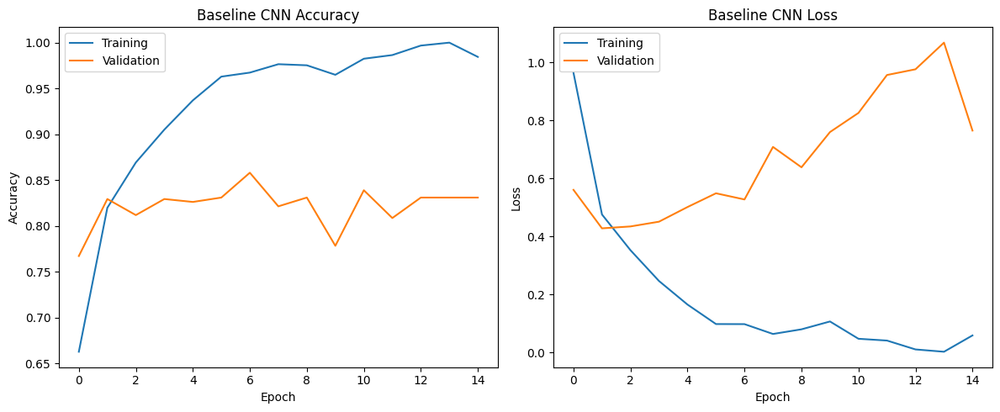

In [47]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Baseline CNN Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Training')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Baseline CNN Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

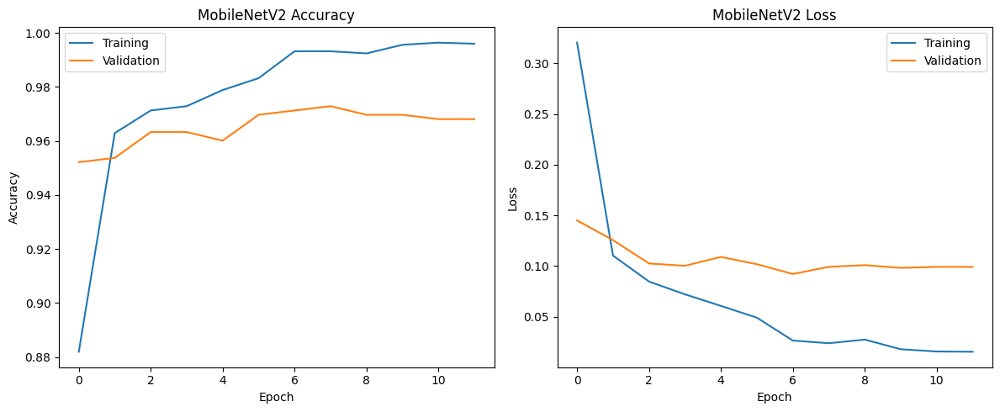

In [48]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(history_mobile.history['accuracy'], label='Training')
plt.plot(history_mobile.history['val_accuracy'], label='Validation')
plt.title('MobileNetV2 Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history_mobile.history['loss'], label='Training')
plt.plot(history_mobile.history['val_loss'], label='Validation')
plt.title('MobileNetV2 Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Model Tuning and Feedback Loop

To improve the model's generalization and reduce the risk of overfitting, several regularization and optimization techniques were incorporated during model development.

The following techniques were used:

- **Data Augmentation:** Random horizontal flipping and random rotation were applied to increase the diversity of the training images.
- **Dropout:** Dropout layers were added to the classifier head to reduce over-reliance on specific neurons.
- **Early Stopping:** Training was stopped automatically when the validation performance stopped improving, preventing unnecessary training and reducing overfitting.
- **Reduce Learning Rate on Plateau:** The learning rate was automatically reduced when the validation loss stopped improving, allowing the optimizer to converge more effectively.
- **Transfer Learning:** MobileNetV2 pretrained on ImageNet was used as the feature extractor, enabling the model to learn robust visual representations from a relatively small dataset.

---

## Observations

The baseline CNN showed clear signs of overfitting, with training accuracy approaching 100% while validation accuracy remained significantly lower.

After applying transfer learning with MobileNetV2, the gap between the training and validation curves reduced considerably, and both accuracy and loss curves remained stable throughout training. The final model achieved a **test accuracy of 93.7%**, indicating strong generalization to unseen images.

---

## Feedback Loop

Although the current model performs well, continuous monitoring is essential after deployment.

Future improvements may include:

- Collecting additional real-world images from farms and warehouses.
- Periodically retraining the model using newly collected data.
- Monitoring prediction accuracy on production images to detect model drift.
- Expanding the dataset to include additional vegetable categories and more challenging market scenes.
- Fine-tuning more layers of the pretrained network if larger datasets become available.

---

## Business Insight

A continuous feedback loop ensures that the classification model remains accurate as new products, image conditions, and operational environments evolve. Regular retraining and monitoring help maintain high classification performance, reducing sorting errors and supporting reliable automation within Ninjacart's supply chain.

In [49]:
#

In [50]:
#

In [51]:
#

In [52]:
#

In [53]:
#

In [54]:
#

In [55]:
#

In [56]:
#

In [57]:
#

In [58]:
#

In [59]:
#

In [60]:
#

In [61]:
#

In [62]:
#

In [63]:
#

In [64]:
#

In [65]:
#

In [66]:
#

In [69]:
#
/

()

In [70]:
#

In [71]:
#

In [72]:
#

In [73]:
#

In [74]:
#

In [75]:
#